# 텍스트 군집 분석

In [1]:
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'
import matplotlib.font_manager as fm
fontpath = '/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf'
fontprop = fm.FontProperties(fname=fontpath, size=8) 
#폰트종류설정
plt.rcParams["font.family"] = 'NanumGothic'

#폰트크기설정
#plt.rcParams["font.size"] = 20

c:\Users\82107\anaconda3\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
c:\Users\82107\anaconda3\lib\site-packages\numpy\.libs\libopenblas.EL2C6PLE4ZYW3ECEVIV3OXXGRN2NRFM2.gfortran-win_amd64.dll
c:\Users\82107\anaconda3\lib\site-packages\numpy\.libs\libopenblas64__v0.3.21-gcc_10_3_0.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


## 데이터 전처리

In [2]:
import konlpy
import urllib.request
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('seaborn-white')

from konlpy.tag import Mecab

C:\Users\82107\AppData\Local\Temp\ipykernel_32976\3924586971.py:7: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-white')


In [3]:
import pandas as pd
import numpy as np
data_df = pd.read_csv('../../data/ulsan_attraction_table.csv')
data_df.head()

,place_id,u_id,user_id,score,comment,p_id
0,가지산 입석대,0,김호영(황소바위),5,NaN,248
1,가지산 입석대,1,기회란,4,NaN,248
2,가지산 입석대,2,손영진(산동무),5,NaN,248
3,가지산,0,김호영(황소바위),5,NaN,16
4,가지산,3,여름햇살,5,계단과 가파른 길이 많아 힘은 들지만 정상에서 바라보는 영남알프스의 풍경 값으로는 ...,16


In [4]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15405 entries, 0 to 15404
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   place_id  15405 non-null  object
 1   u_id      15405 non-null  int64 
 2   user_id   15405 non-null  object
 3   score     15405 non-null  int64 
 4   comment   10548 non-null  object
 5   p_id      15405 non-null  int64 
dtypes: int64(3), object(3)
memory usage: 722.2+ KB


In [5]:
data_df['comment'] = data_df['comment'].str.replace("[^ㄱ-하-ㅣ가-힣 ]", "")

C:\Users\82107\AppData\Local\Temp\ipykernel_32976\2728893579.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  data_df['comment'] = data_df['comment'].str.replace("[^ㄱ-하-ㅣ가-힣 ]", "")


In [6]:
print(data_df.isnull().sum())

data_df = data_df.dropna(how='any')

place_id       0
u_id           0
user_id        0
score          0
comment     4857
p_id           0
dtype: int64


In [7]:
data_df['comment'].replace('', np.nan, inplace=True)
data_df = data_df.dropna(how='any')
print(len(data_df))
print(data_df.isnull().sum())

10512
place_id    0
u_id        0
user_id     0
score       0
comment     0
p_id        0
dtype: int64


## 토큰화 및 불용어 제거

In [8]:
file = open('../../data/stop_word.txt', 'r')

stopWord = []
l = ''
while True:
    l = file.readline()
    stopWord.append(l[:-1])
    if l == '':
        break

In [9]:
len(stopWord)

676

In [11]:
from konlpy.tag import Mecab

mecab =Mecab(dicpath=r'C:\\mecab\\mecab-ko-dic')

reviews = []
for sentence in data_df['comment']:
    reviews.append([word for word in mecab.nouns(str(sentence)) if not word in stopWord])

print(len(reviews))
data_df['reviews'] = reviews

10512


In [12]:
data_df.head()

,place_id,u_id,user_id,score,comment,p_id,reviews
4,가지산,3,여름햇살,5,계단과 가파른 길이 많아 힘은 들지만 정상에서 바라보는 영남알프스의 풍경 값으로는 ...,16,"[계단, 길, 힘, 정상, 영남, 알프스, 풍경, 값, 만, 가치, 석남, 터널, ..."
5,가지산,4,Jayen Yang,5,등린이 번째 산행 다녀왔습니다영알 영남 알프스 밀양 가지산대 명산을 다녀왔습니다 ...,16,"[린, 번, 산행, 영알, 영남, 알프스, 밀양, 가지, 산대, 명산, 코스, 석남..."
6,가지산,5,최정혜,4,상양마을에서 올라가는 코스를 잡았구요마을에 주차장십여대주차가능 및 경로당화장실 이용...,16,"[상양, 마을, 코스, 마을, 주차장, 십, 대, 주차, 가능, 경로당, 화장실, ..."
7,가지산,6,이창환,4,가지산은 울산광역시 울주군과 경상남도 밀양시 경상북도 청도군의 경계에 있는 산이다년...,16,"[가지산, 울산광역시, 울주군, 경상남도, 밀양시, 경상북도, 청도군, 경계, 산,..."
8,가지산,7,TaeHwa Kwon,3,영남날프스 산중에 겨울 눈을 제일 자주 볼수 있는 산,16,"[영남, 산중, 겨울, 눈, 수, 산]"


## Word2Vec 생성

Skip gram 활용

In [13]:
from gensim.models import Word2Vec
from sklearn.manifold import TSNE
from matplotlib import font_manager as fm
from matplotlib import rc

In [14]:
word2vec_sg = Word2Vec(reviews, min_count=3, vector_size=100, window=5, sg=1)

In [15]:
word2vec_sg.wv.most_similar('곳')

[('상징', 0.9153997302055359),
 ('단위', 0.9111011624336243),
 ('데이트', 0.9109662771224976),
 ('수', 0.9099879860877991),
 ('구경', 0.9087304472923279),
 ('여유', 0.9075402021408081),
 ('작년', 0.9028043150901794),
 ('친구', 0.8994256854057312),
 ('아기', 0.8953508734703064),
 ('부부', 0.8946733474731445)]

## t-sne을 활용한 시각화

In [16]:
tsne = TSNE(n_components=2) # n_components는 차원을 뜻함 

In [17]:
vocab = word2vec_sg.wv.key_to_index
similarity = word2vec_sg.wv[vocab]

In [18]:
import pandas as pd

transform_similarity = tsne.fit_transform(similarity) # 전체 similarity를 tsne n_components만큼 변형 ex n=2 -> 2차원
df = pd.DataFrame(transform_similarity, index=vocab, columns=['x', 'y'])

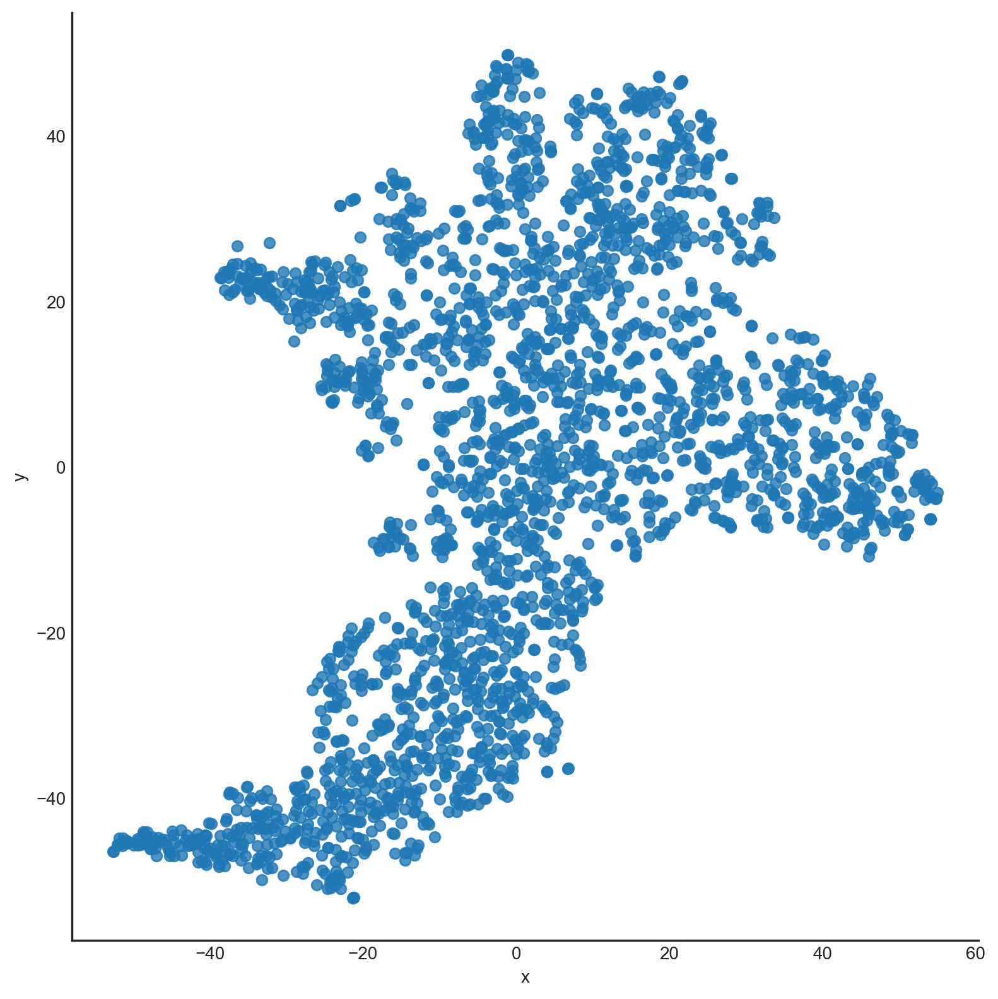

In [19]:
sns.lmplot(x= 'x',y= 'y', data=df, fit_reg=False, height=8)
plt.show()

CBOW 활용

In [20]:
word2vec_cb = Word2Vec(reviews, min_count=3, vector_size=100, window=5, sg=0)

In [21]:
word2vec_cb.wv.most_similar('곳')

[('구경', 0.9989572763442993),
 ('휴식', 0.9988393187522888),
 ('친구', 0.9987255930900574),
 ('곳곳', 0.9986487627029419),
 ('생각', 0.9985854625701904),
 ('바람', 0.9985262155532837),
 ('바퀴', 0.998474657535553),
 ('점', 0.998437762260437),
 ('시민', 0.9984328746795654),
 ('저녁', 0.9984244108200073)]

## t-sne을 활용한 시각화(2차원)

In [22]:
tsne = TSNE(n_components=2) # n_components는 차원을 뜻함 

In [23]:
vocab = word2vec_sg.wv.key_to_index
similarity = word2vec_cb.wv[vocab]

In [24]:
transform_similarity = tsne.fit_transform(similarity) # 전체 similarity를 tsne n_components만큼 변형 ex n=2 -> 2차원
df = pd.DataFrame(transform_similarity, index=vocab, columns=['x', 'y'])

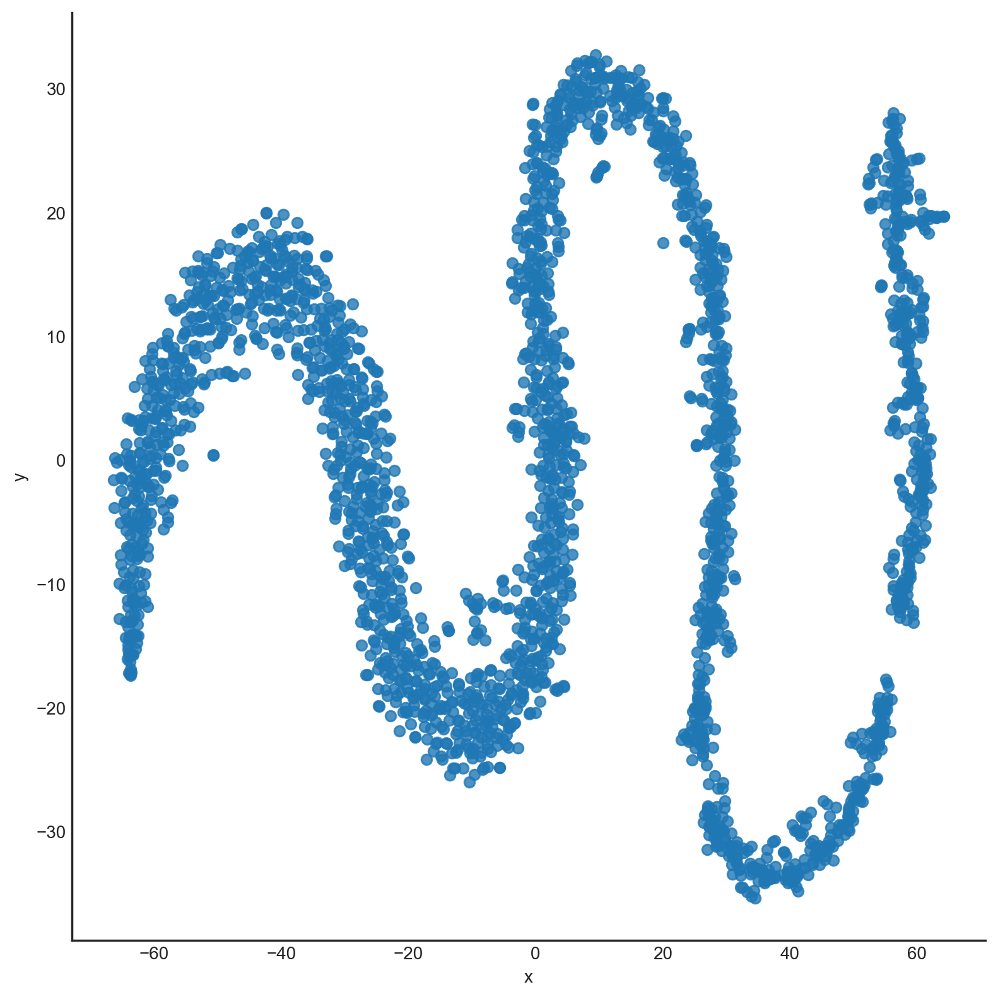

In [25]:
sns.lmplot(x= 'x',y= 'y', data=df, fit_reg=False, height=8)
plt.show()

## t-sne을 활용한 시각화(3차원)

In [26]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap
# plt.style.use('seaborn-white')

In [27]:
tsne = TSNE(n_components=3) # n_components는 차원을 뜻함 

In [28]:
transform_similarity = tsne.fit_transform(similarity) # 전체 similarity를 tsne n_components만큼 변형 ex n=2 -> 2차원
df = pd.DataFrame(transform_similarity, index=vocab, columns=['x', 'y', 'z'])

c:\Users\82107\anaconda3\lib\site-packages\matplotlib\collections.py:1080: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "


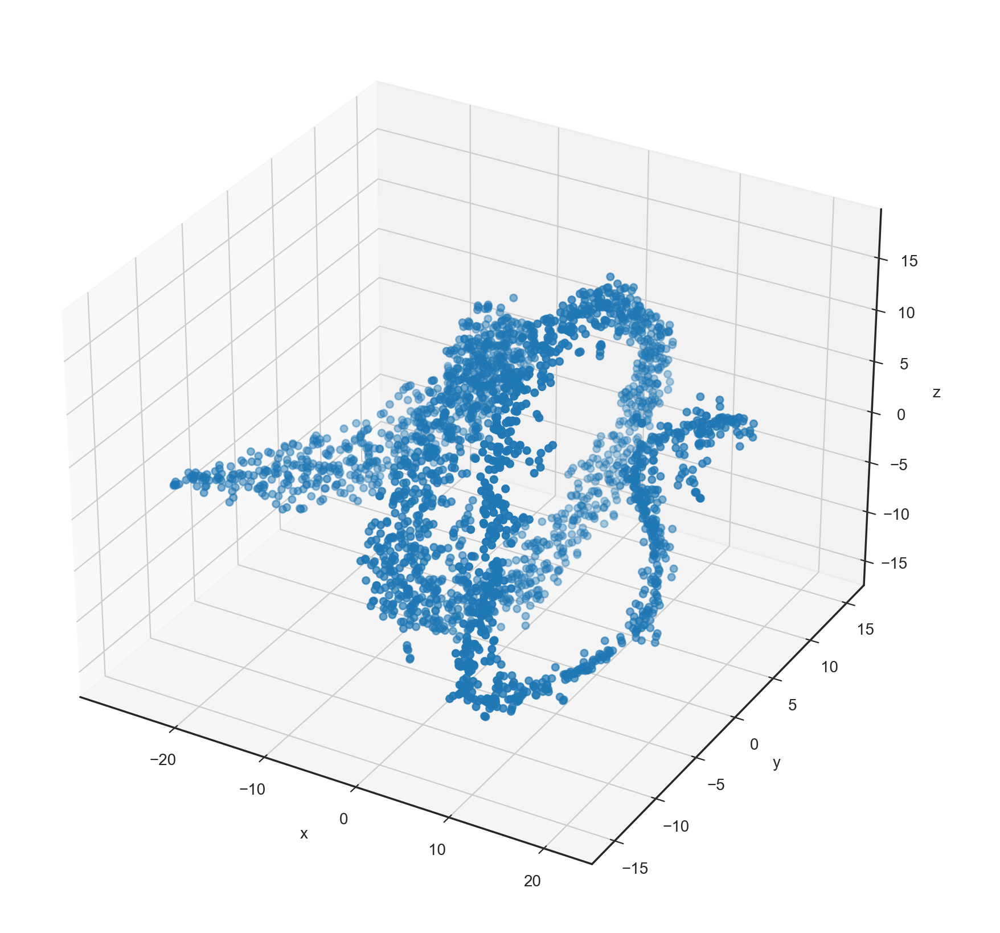

In [29]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap
# plt.style.use('seaborn-white')
fig = plt.figure(figsize=(12, 8))
ax = Axes3D(fig)
fig.add_axes(ax)
# ax = fig.add_subplot(111, projection = '3d')
cmap = ListedColormap(sns.color_palette("husl", 256).as_hex())
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")

sc = ax.scatter(df['x'], df['y'], df['z'])
plt.legend(*sc.legend_elements(), bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

## 군집화

### 계층적 군집화

#### ward

In [30]:
from sklearn.cluster import AgglomerativeClustering

ward = AgglomerativeClustering(n_clusters=10, linkage='ward')
predict = ward.fit_predict(df)
# data_df['clusters'] = predict
df['predict'] = predict

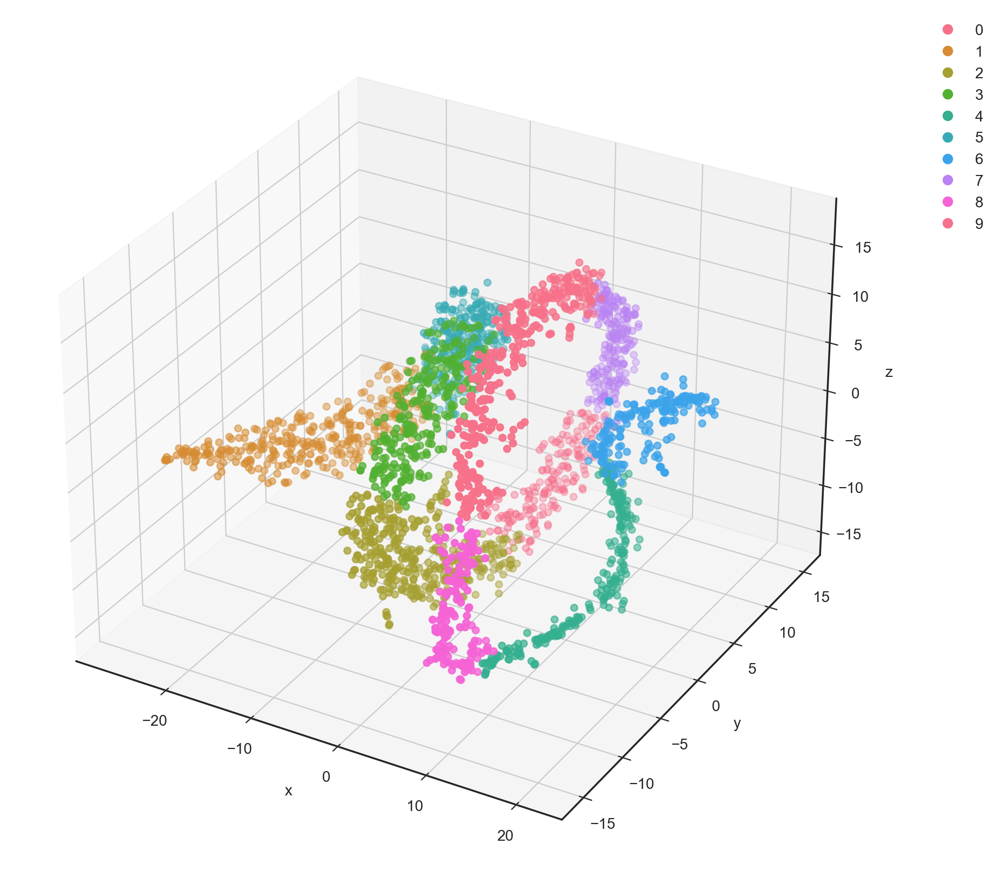

In [31]:
fig = plt.figure(figsize=(12, 8))
ax = Axes3D(fig)
fig.add_axes(ax)
# ax = fig.add_subplot(111, projection = '3d')
cmap = ListedColormap(sns.color_palette("husl", 256).as_hex())
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")

sc = ax.scatter(df['x'], df['y'], df['z'], c=df['predict'], cmap=cmap)
plt.legend(*sc.legend_elements(), bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

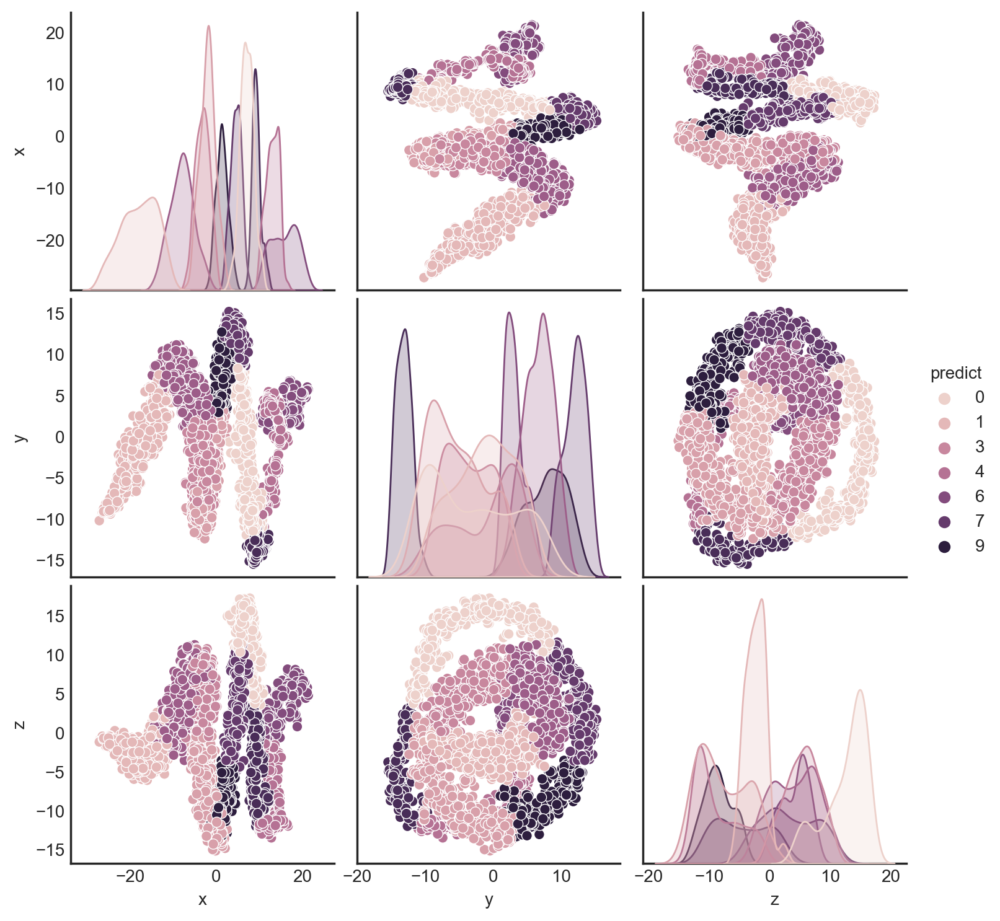

In [32]:
sns.pairplot(df, hue='predict')

<Axes: xlabel='predict', ylabel='count'>

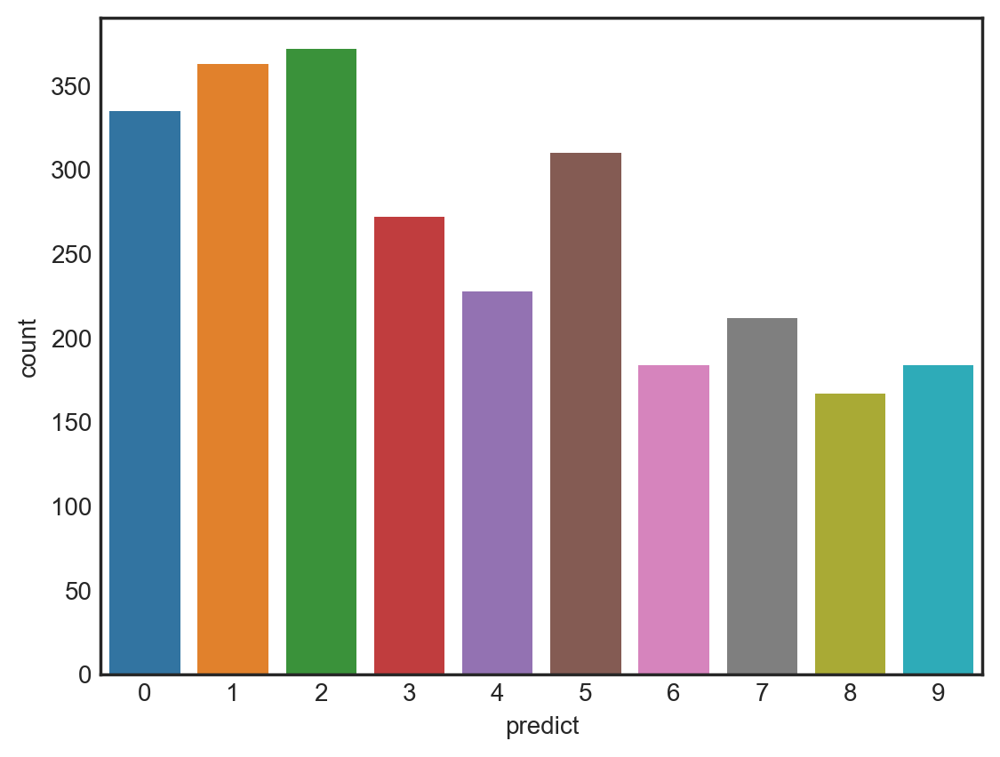

In [33]:
sns.countplot(x=df['predict'])

In [34]:
cluster0 = list(df[df['predict']==0].index)
cluster1 = list(df[df['predict']==1].index)
cluster2 = list(df[df['predict']==2].index)
cluster3 = list(df[df['predict']==3].index)
cluster4 = list(df[df['predict']==4].index)
cluster5 = list(df[df['predict']==5].index)
cluster6 = list(df[df['predict']==6].index)
cluster7 = list(df[df['predict']==7].index)
cluster8 = list(df[df['predict']==8].index)
cluster9 = list(df[df['predict']==9].index)

In [35]:
print(f'cluster0: {cluster0[:10]}')
print(f'cluster1: {cluster1[:10]}')
print(f'cluster2: {cluster2[:10]}')
print(f'cluster3: {cluster3[:10]}')
print(f'cluster4: {cluster4[:10]}')
print(f'cluster5: {cluster5[:10]}')
print(f'cluster6: {cluster6[:10]}')
print(f'cluster7: {cluster7[:10]}')
print(f'cluster8: {cluster8[:10]}')
print(f'cluster9: {cluster9[:10]}')

cluster0: ['순천', '노후', '조아', '경험', '최적', '접근', '커피숍', '성인', '교육', '벗']
cluster1: ['보람', '산채', '사회', '애견', '속도', '만평', '내어', '횡', '스팟', '롱']
cluster2: ['변화', '비오', '고향', '그늘막', '도중', '남녀노소', '음악', '선선', '작년', '대중교통']
cluster3: ['바베큐', '해바라기', '도서관', '폭포수', '봄날', '어려움', '진입', '낙동정맥', '사계', '브런치']
cluster4: ['굿', '계절', '공기', '연인', '분위기', '명소', '겨울', '조성', '전망', '은하수']
cluster5: ['자전거길', '도시락', '불법', '광경', '흙', '랜드마크', '베스트', '용', '별거', '쌈']
cluster6: ['곳', '수', '울산', '산책', '길', '물', '공원', '장소', '정원', '시설']
cluster7: ['사색', '꽃구경', '친화', '볼', '동반', '낙후', '드라이브', '바닷바람', '트래킹', '간식']
cluster8: ['아기', '대표', '일출', '가보세요', '부산', '중구', '짱', '감상', '동구', '단점']
cluster9: ['출입구', '시골', '일몰', '해파', '장미꽃', '강가', '쉼', '고생', '배내골', '구름']


#### average

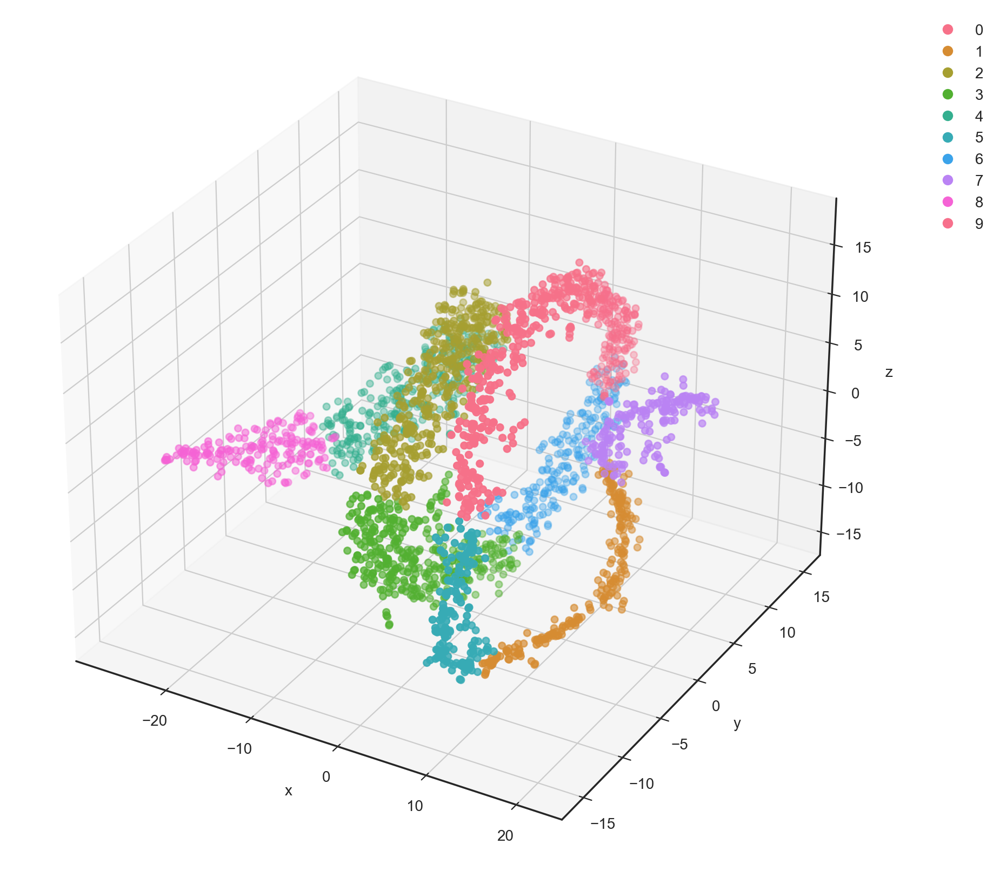

In [36]:
avg = AgglomerativeClustering(n_clusters=10, linkage='average')
predict= avg.fit_predict(df)
results = df
results['predict'] = predict

# plt.style.use('seaborn-white')
fig = plt.figure(figsize=(12, 8))
ax = Axes3D(fig)
fig.add_axes(ax)
# ax = fig.add_subplot(111, projection = '3d')
cmap = ListedColormap(sns.color_palette("husl", 256).as_hex())
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")

sc = ax.scatter(df['x'], df['y'], df['z'], c=df['predict'], cmap=cmap)
plt.legend(*sc.legend_elements(), bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

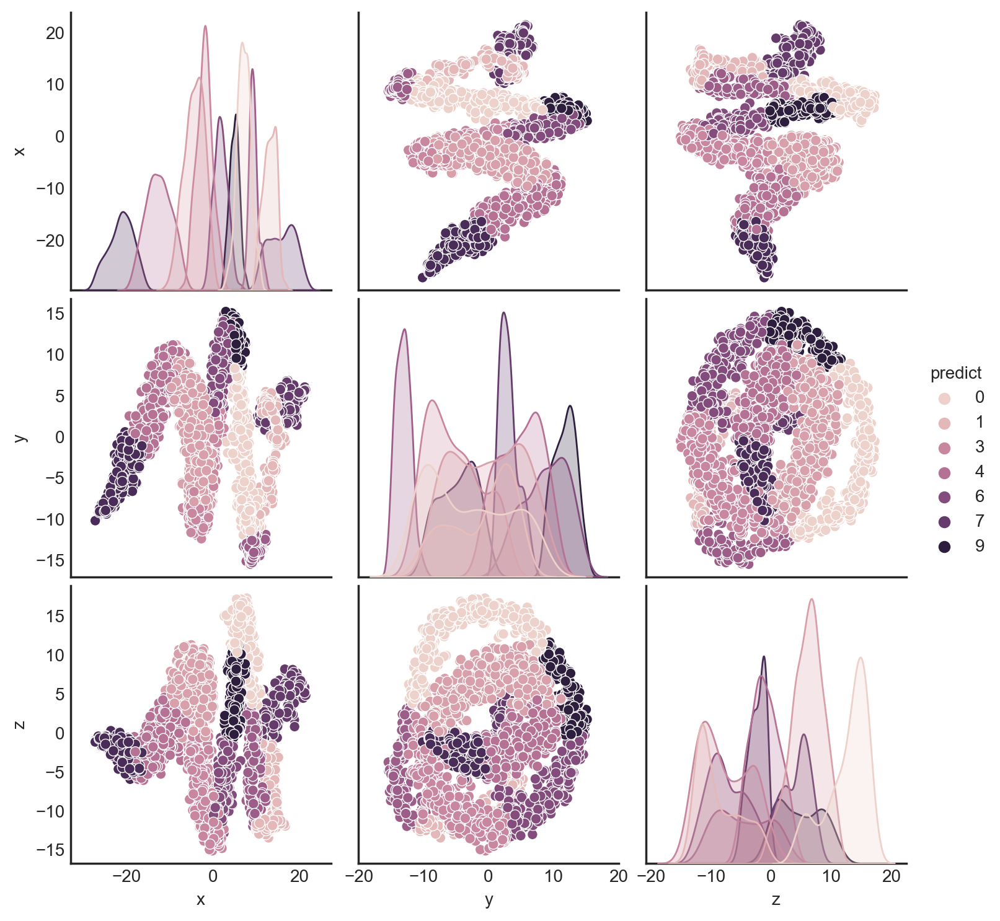

In [37]:
sns.pairplot(df, hue='predict')

<Axes: xlabel='predict', ylabel='count'>

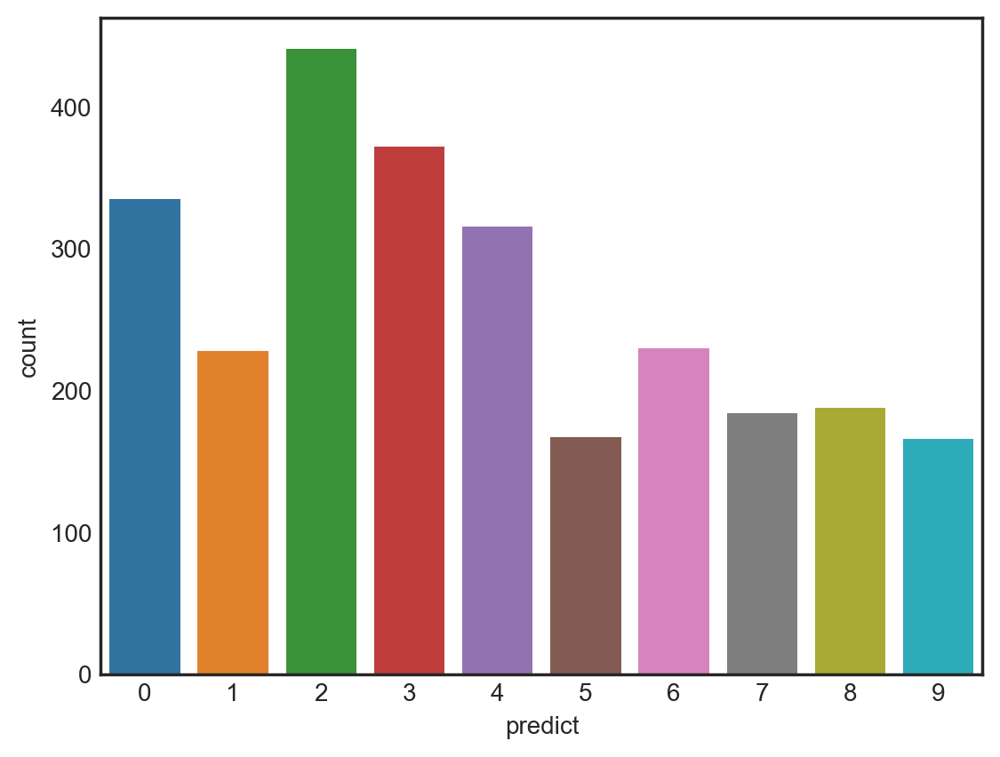

In [38]:
sns.countplot(x=df['predict'])

In [39]:
cluster0 = list(df[df['predict']==0].index)
cluster1 = list(df[df['predict']==1].index)
cluster2 = list(df[df['predict']==2].index)
cluster3 = list(df[df['predict']==3].index)
cluster4 = list(df[df['predict']==4].index)
cluster5 = list(df[df['predict']==5].index)
cluster6 = list(df[df['predict']==6].index)
cluster7 = list(df[df['predict']==7].index)
cluster8 = list(df[df['predict']==8].index)
cluster9 = list(df[df['predict']==9].index)

In [40]:
print(f'cluster0: {cluster0[:10]}')
print(f'cluster1: {cluster1[:10]}')
print(f'cluster2: {cluster2[:10]}')
print(f'cluster3: {cluster3[:10]}')
print(f'cluster4: {cluster4[:10]}')
print(f'cluster5: {cluster5[:10]}')
print(f'cluster6: {cluster6[:10]}')
print(f'cluster7: {cluster7[:10]}')
print(f'cluster8: {cluster8[:10]}')
print(f'cluster9: {cluster9[:10]}')

cluster0: ['순천', '노후', '조아', '경험', '최적', '접근', '커피숍', '성인', '교육', '벗']
cluster1: ['굿', '계절', '공기', '연인', '분위기', '명소', '겨울', '조성', '전망', '은하수']
cluster2: ['바베큐', '자전거길', '해바라기', '도서관', '폭포수', '도시락', '봄날', '어려움', '불법', '광경']
cluster3: ['변화', '비오', '고향', '그늘막', '도중', '남녀노소', '음악', '선선', '작년', '대중교통']
cluster4: ['보람', '아무것', '레이저', '스팟', '롱', '화원', '납량', '제주', '명절', '하와이']
cluster5: ['아기', '대표', '일출', '가보세요', '부산', '중구', '짱', '감상', '동구', '단점']
cluster6: ['출입구', '트래킹', '간식', '공룡능선', '시골', '선바위', '일몰', '가성', '해파', '장미꽃']
cluster7: ['곳', '수', '울산', '산책', '길', '물', '공원', '장소', '정원', '시설']
cluster8: ['산채', '사회', '애견', '속도', '만평', '내어', '횡', '섹션', '봄단장', '회가']
cluster9: ['사색', '꽃구경', '친화', '볼', '동반', '낙후', '드라이브', '바닷바람', '함', '여긴']


#### complete

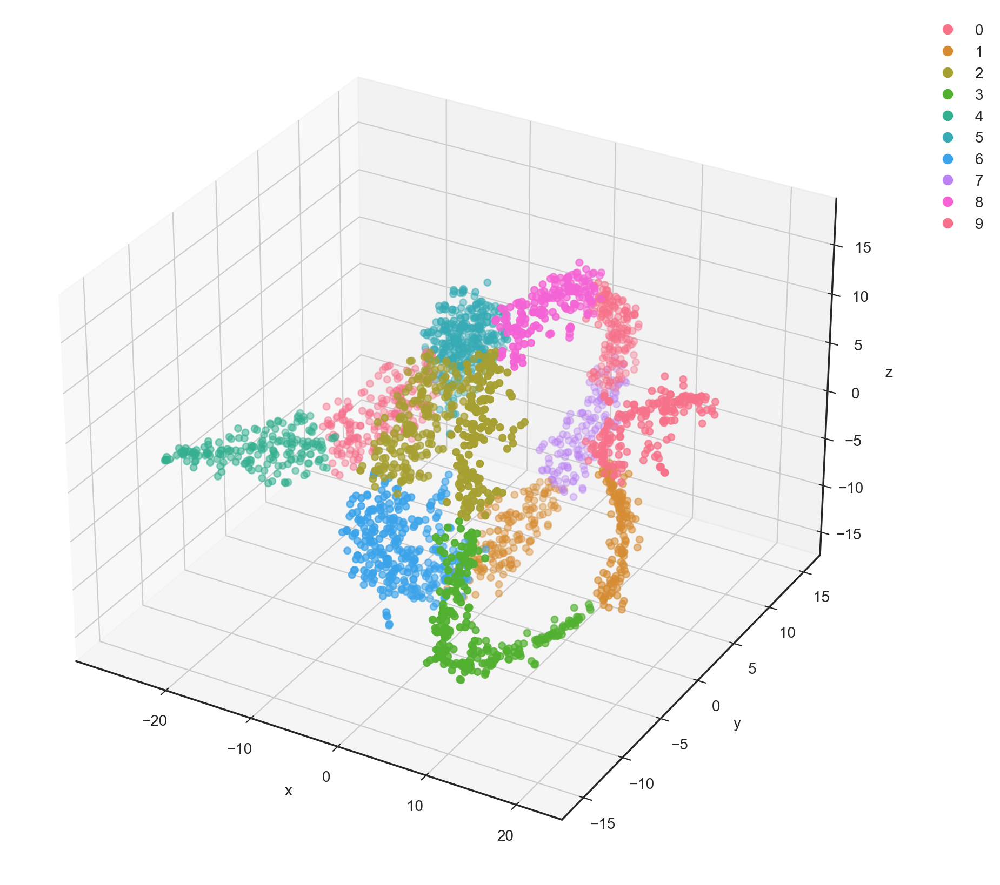

In [41]:
compl = AgglomerativeClustering(n_clusters=10, linkage='complete')
predict = compl.fit_predict(df)
results = df
results['predict'] = predict

fig = plt.figure(figsize=(12, 8))
ax = Axes3D(fig)
fig.add_axes(ax)
# ax = fig.add_subplot(111, projection = '3d')
cmap = ListedColormap(sns.color_palette("husl", 256).as_hex())
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")

sc = ax.scatter(df['x'], df['y'], df['z'], c=df['predict'], cmap=cmap)
plt.legend(*sc.legend_elements(), bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

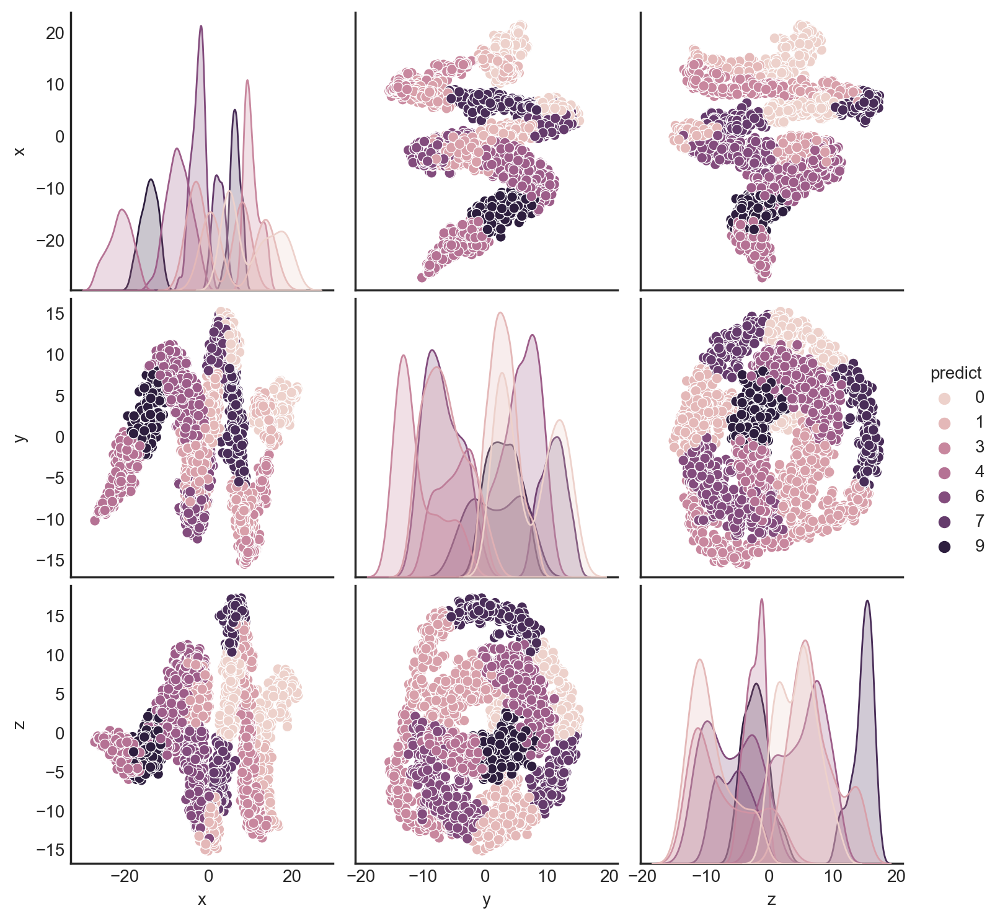

In [42]:
sns.pairplot(df, hue='predict')

<Axes: xlabel='predict', ylabel='count'>

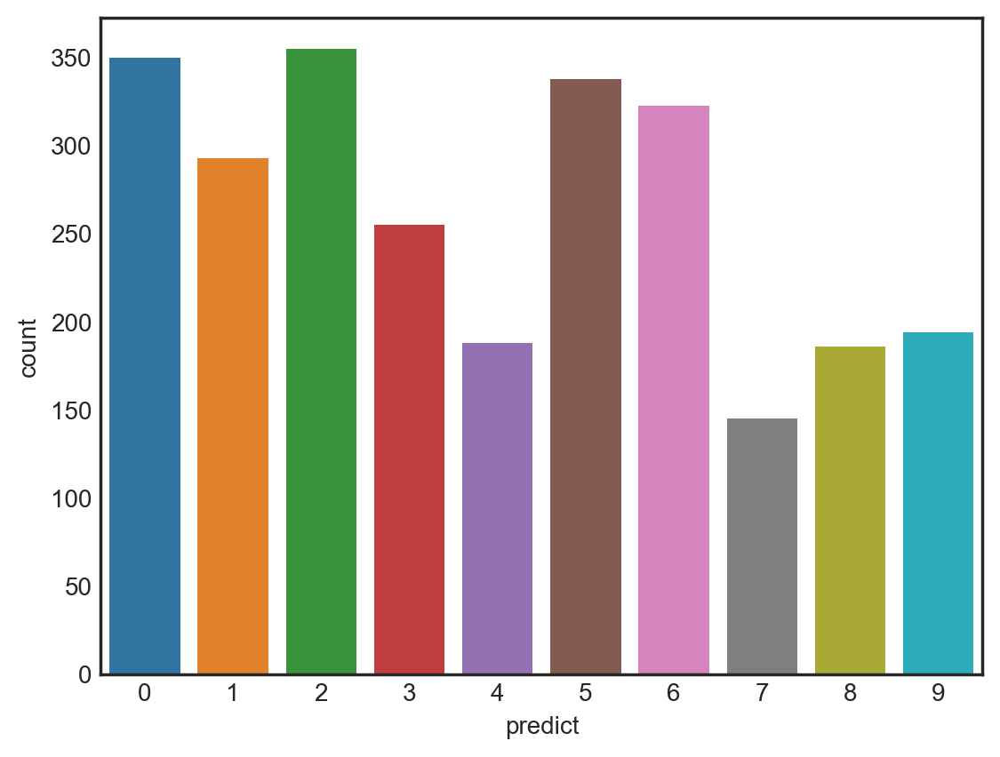

In [43]:
sns.countplot(x=df['predict'])

In [44]:
cluster0 = list(df[df['predict']==0].index)
cluster1 = list(df[df['predict']==1].index)
cluster2 = list(df[df['predict']==2].index)
cluster3 = list(df[df['predict']==3].index)
cluster4 = list(df[df['predict']==4].index)
cluster5 = list(df[df['predict']==5].index)
cluster6 = list(df[df['predict']==6].index)
cluster7 = list(df[df['predict']==7].index)
cluster8 = list(df[df['predict']==8].index)
cluster9 = list(df[df['predict']==9].index)

In [45]:
print(f'cluster0: {cluster0[:10]}')
print(f'cluster1: {cluster1[:10]}')
print(f'cluster2: {cluster2[:10]}')
print(f'cluster3: {cluster3[:10]}')
print(f'cluster4: {cluster4[:10]}')
print(f'cluster5: {cluster5[:10]}')
print(f'cluster6: {cluster6[:10]}')
print(f'cluster7: {cluster7[:10]}')
print(f'cluster8: {cluster8[:10]}')
print(f'cluster9: {cluster9[:10]}')

cluster0: ['곳', '수', '울산', '산책', '길', '물', '공원', '장소', '정원', '시설']
cluster1: ['굿', '계절', '공기', '연인', '분위기', '명소', '겨울', '조성', '전망', '은하수']
cluster2: ['순천', '노후', '경험', '최적', '접근', '커피숍', '성인', '교육', '단장', '유료']
cluster3: ['데이트', '국화', '겸', '나들이', '선사', '아기', '나름', '대표', '매력', '목욕탕']
cluster4: ['산채', '사회', '애견', '속도', '만평', '내어', '횡', '섹션', '봄단장', '회가']
cluster5: ['자전거길', '도시락', '불법', '광경', '흙', '랜드마크', '사계', '베스트', '용', '별거']
cluster6: ['변화', '고향', '음악', '선선', '작년', '문수산', '픽', '등억', '수량', '의외']
cluster7: ['출입구', '트래킹', '간식', '공룡능선', '시골', '선바위', '일몰', '가성', '해파', '쉼']
cluster8: ['조아', '벗', '휴식처', '가족탕', '공부', '둘레길', '만개', '밭길', '보통', '근교']
cluster9: ['보람', '스팟', '롱', '화원', '납량', '실재', '장식', '입춘', '문자', '좁음']


### 비계층적 군집화

#### K-Means

c:\Users\82107\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\82107\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=11.
  warnings.warn(


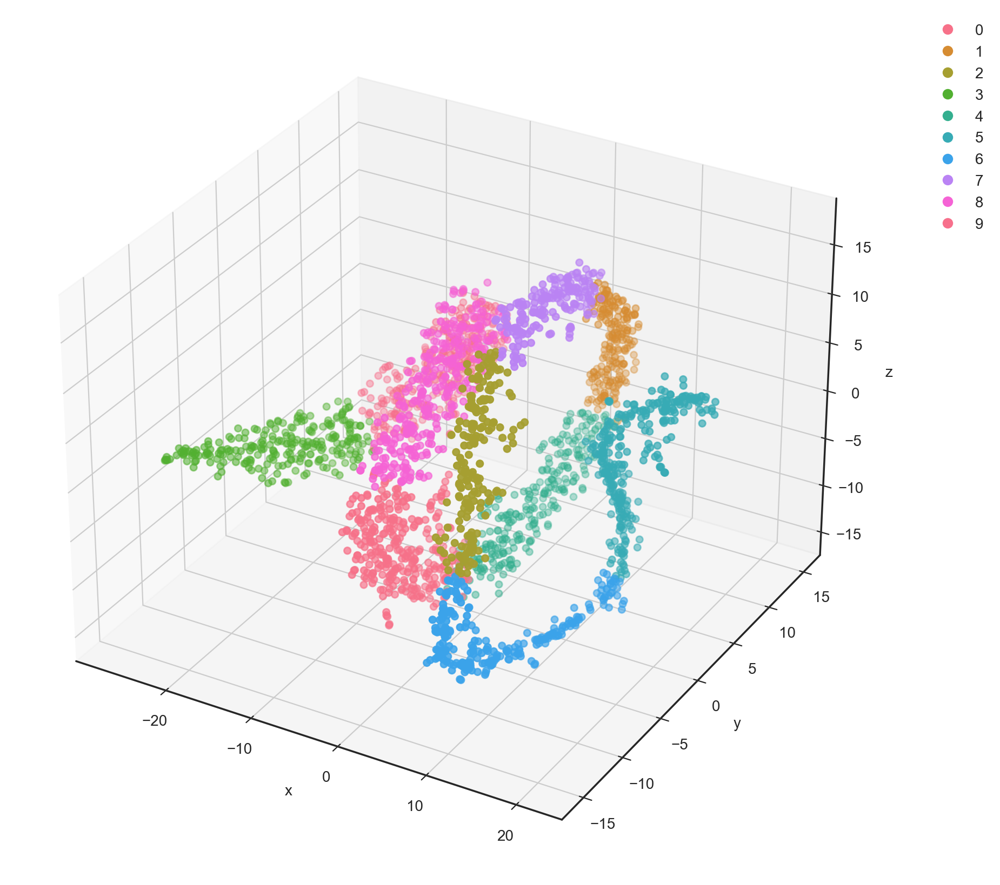

In [46]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=10)
predict = kmeans.fit_predict(df)
results = df
results['predict'] = predict

fig = plt.figure(figsize=(12, 8))
ax = Axes3D(fig)
fig.add_axes(ax)
# ax = fig.add_subplot(111, projection = '3d')
cmap = ListedColormap(sns.color_palette("husl", 256).as_hex())
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")

sc = ax.scatter(df['x'], df['y'], df['z'], c=df['predict'], cmap=cmap)
plt.legend(*sc.legend_elements(), bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

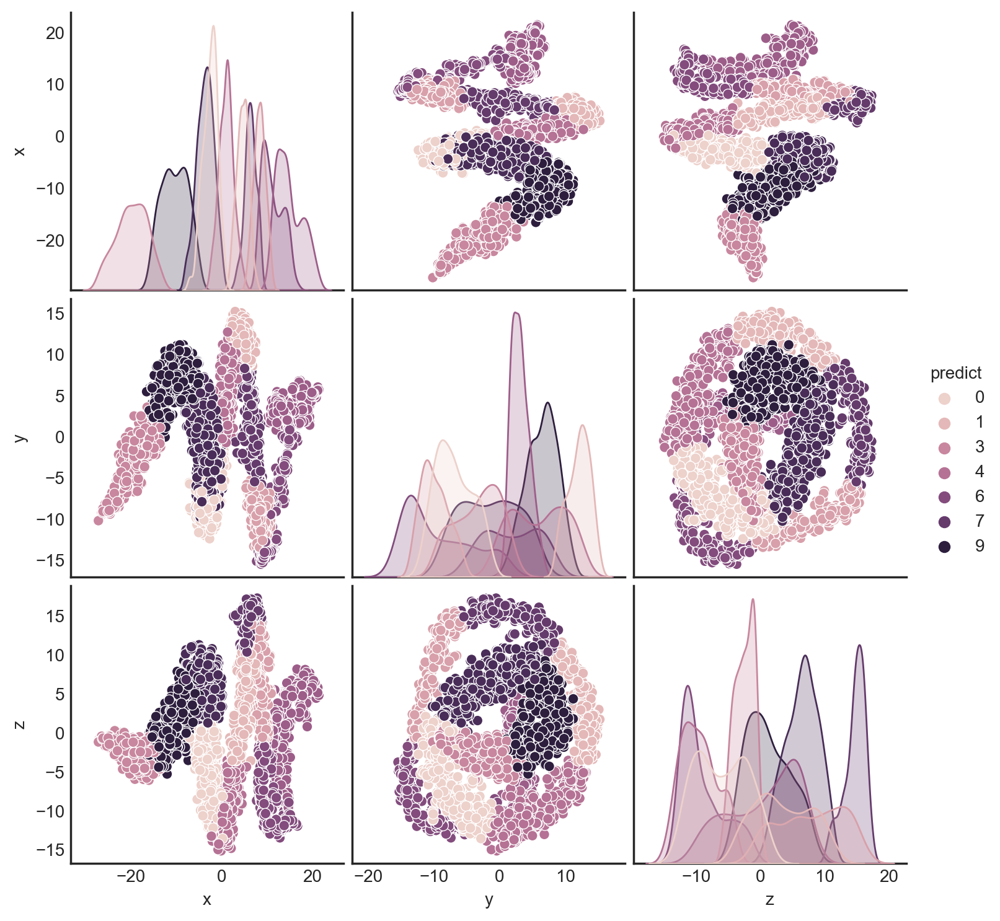

In [47]:
sns.pairplot(df, hue='predict')

<Axes: xlabel='predict', ylabel='count'>

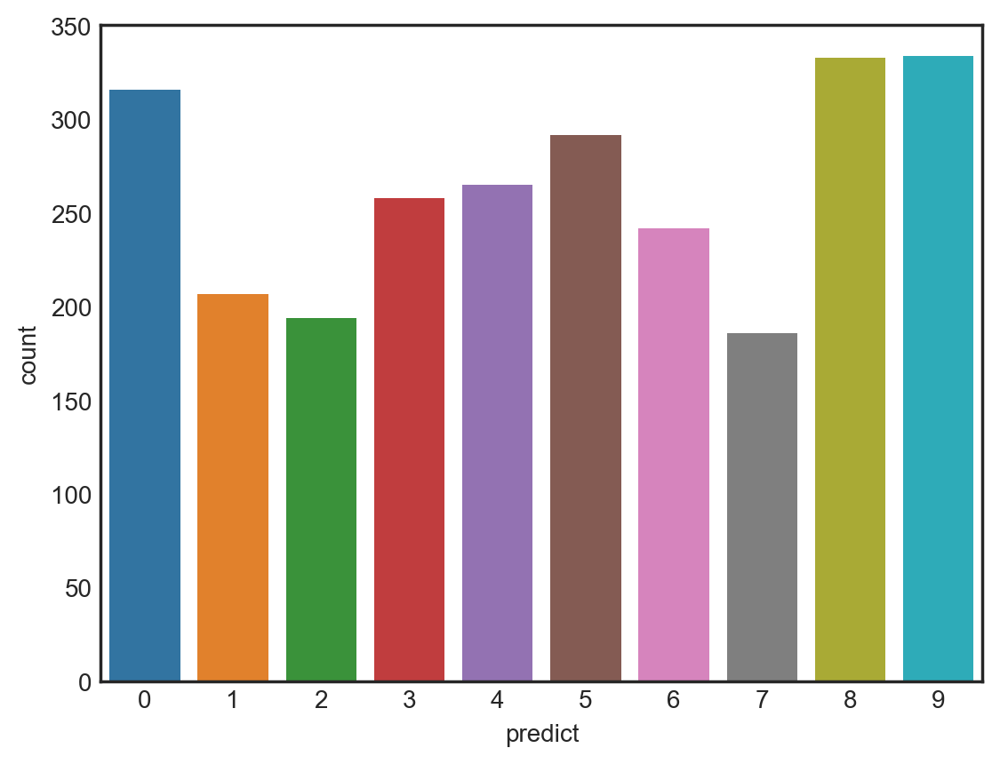

In [48]:
sns.countplot(x=df['predict'])

In [49]:
cluster0 = list(df[df['predict']==0].index)
cluster1 = list(df[df['predict']==1].index)
cluster2 = list(df[df['predict']==2].index)
cluster3 = list(df[df['predict']==3].index)
cluster4 = list(df[df['predict']==4].index)
cluster5 = list(df[df['predict']==5].index)
cluster6 = list(df[df['predict']==6].index)
cluster7 = list(df[df['predict']==7].index)
cluster8 = list(df[df['predict']==8].index)
cluster9 = list(df[df['predict']==9].index)

In [50]:
print(f'cluster0: {cluster0[:10]}')
print(f'cluster1: {cluster1[:10]}')
print(f'cluster2: {cluster2[:10]}')
print(f'cluster3: {cluster3[:10]}')
print(f'cluster4: {cluster4[:10]}')
print(f'cluster5: {cluster5[:10]}')
print(f'cluster6: {cluster6[:10]}')
print(f'cluster7: {cluster7[:10]}')
print(f'cluster8: {cluster8[:10]}')
print(f'cluster9: {cluster9[:10]}')

cluster0: ['고향', '음악', '선선', '작년', '문수산', '픽', '등억', '수량', '의외', '만점']
cluster1: ['사색', '꽃구경', '친화', '볼', '동반', '낙후', '드라이브', '바닷바람', '간식', '공룡능선']
cluster2: ['가보세요', '순천', '노후', '배내봉', '경험', '최적', '접근', '커피숍', '성인', '교육']
cluster3: ['산채', '사회', '애견', '속도', '만평', '내어', '횡', '납량', '섹션', '봄단장']
cluster4: ['변화', '출입구', '트래킹', '비오', '시골', '일몰', '해파', '그늘막', '도중', '장미꽃']
cluster5: ['곳', '수', '울산', '산책', '길', '물', '공원', '장소', '정원', '시설']
cluster6: ['데이트', '국화', '겸', '나들이', '여유', '편안', '선사', '환경', '아기', '나름']
cluster7: ['조아', '벗', '휴식처', '가족탕', '공부', '둘레길', '만개', '밭길', '보통', '근교']
cluster8: ['바베큐', '자전거길', '해바라기', '도서관', '도시락', '봄날', '어려움', '불법', '광경', '진입']
cluster9: ['보람', '베스트', '별거', '아무것', '레이저', '봄여름', '만끽', '심장', '스팟', '롱']


#### DBSCAN

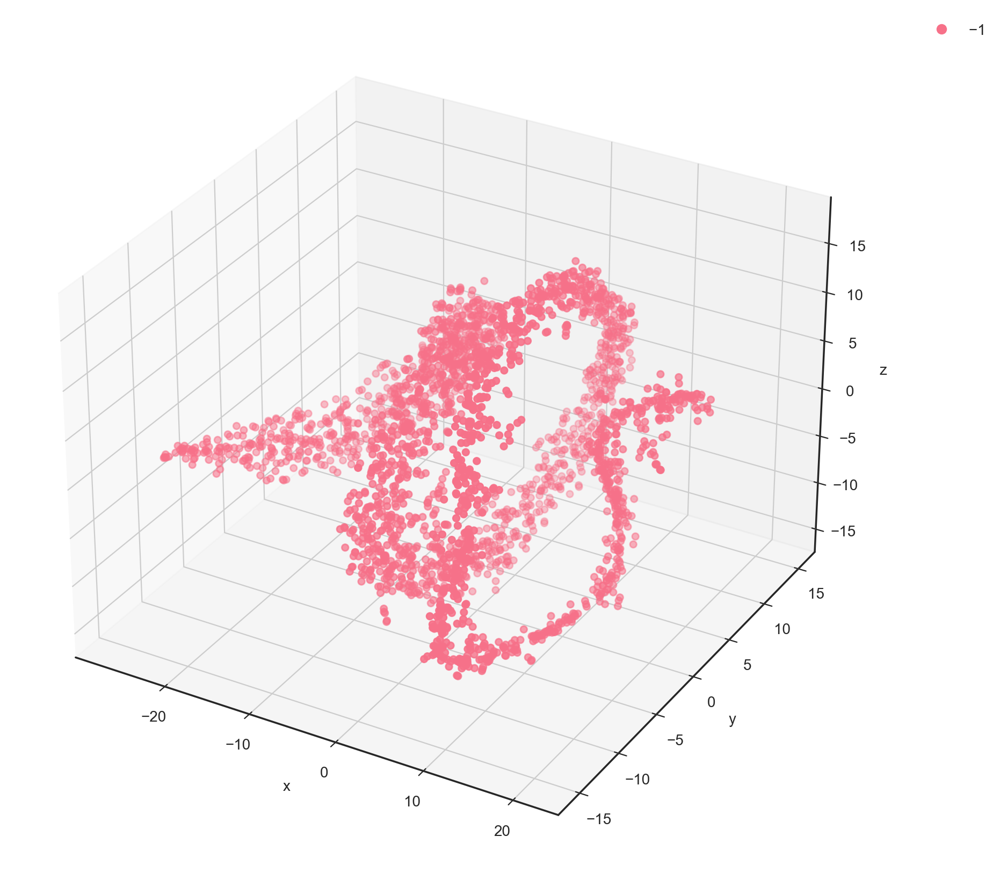

In [51]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(min_samples=100, eps=3)
predict = dbscan.fit_predict(df)
results = df
results['predict'] = predict

fig = plt.figure(figsize=(12, 8))
ax = Axes3D(fig)
fig.add_axes(ax)
# ax = fig.add_subplot(111, projection = '3d')
cmap = ListedColormap(sns.color_palette("husl", 256).as_hex())
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")

sc = ax.scatter(df['x'], df['y'], df['z'], c=df['predict'], cmap=cmap)
plt.legend(*sc.legend_elements(), bbox_to_anchor=(1.05, 1), loc=2)
plt.show()